In [1]:
%load_ext pycodestyle_magic
%pycodestyle_on

# Part ① Merging and cleaning datasets

## Table of contents
- <a href='#C0'>0. Importing libraries and datasets</a>
- <a href='#C1'>1. Merging dataframes</a>
    - <a href='#C1.1'>1.1 Dataframes overview</a>
    - <a href='#C1.2'>1.2 Products and their translation</a>
    - <a href='#C1.3'>1.3 Sellers and their location</a>
    - <a href='#C1.4'>1.4 Order items with products and sellers</a>
    - <a href='#C1.5'>1.5 Regrouping all orders data</a>
    - <a href='#C1.6'>1.6 Regrouping all customer data</a>
- <a href='#C2'>2. Cleaning</a>
    - <a href='#C2.1'>2.1 ID and duplicates</a>
    - <a href='#C2.2'>2.2 Location</a>
    - <a href='#C2.3'>2.3 Payment</a>
    - <a href='#C2.4'>2.4 Products information</a>
    - <a href='#C2.5'>2.5 Review score</a>
    - <a href='#C2.6'>2.6 Dates</a>
- <a href='#C3'>3. Exportation</a>    
    

# <a name="C0">0. Importing libraries and datasets</a>

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

import matplotlib.image as mpimg
import plotly.graph_objects as go
import plotly.express as px
import geopandas as gpd
import os
if not os.path.exists('images'):
    os.mkdir('images')

from sklearn.impute import KNNImputer

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
sns.set_style("white")

In [4]:
files = {'df_customers': './olist_customers_dataset.csv',
         'df_geolocation': './olist_geolocation_dataset.csv',
         'df_order_items': './olist_order_items_dataset.csv',
         'df_order_payments': './olist_order_payments_dataset.csv',
         'df_order_reviews': './olist_order_reviews_dataset.csv',
         'df_orders_dataset': './olist_orders_dataset.csv',
         'df_products_dataset': './olist_products_dataset.csv',
         'df_sellers': './olist_sellers_dataset.csv',
         'df_category_translation': './product_category_name_translation.csv'
         }

for key, value in files.items():
    dfs = {key: pd.read_csv(value) for key, value in files.items()}

# <a name="C1">1. Joining dataframes</a>

## <a name="C1.1">1.1 Dataframes overview</a>

In [5]:
for key, value in dfs.items():
    print(f'{key}')
    print(f'{list(value.columns)}\n')

df_customers
['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']

df_geolocation
['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state']

df_order_items
['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value']

df_order_payments
['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value']

df_order_reviews
['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']

df_orders_dataset
['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']

df_products_dataset
['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g',

In [6]:
print('Size: ')
for key, value in dfs.items():
    print(f'\t - {key} --- {list(value.shape)}')

Size: 
	 - df_customers --- [99441, 5]
	 - df_geolocation --- [1000163, 5]
	 - df_order_items --- [112650, 7]
	 - df_order_payments --- [103886, 5]
	 - df_order_reviews --- [99224, 7]
	 - df_orders_dataset --- [99441, 8]
	 - df_products_dataset --- [32951, 9]
	 - df_sellers --- [3095, 4]
	 - df_category_translation --- [71, 2]


In [7]:
print('Nan count: ')
for key, value in dfs.items():
    print(f'\t - {key} --- {value.isna().sum().sum()}')
    

Nan count: 
	 - df_customers --- 0
	 - df_geolocation --- 0
	 - df_order_items --- 0
	 - df_order_payments --- 0
	 - df_order_reviews --- 145903
	 - df_orders_dataset --- 4908
	 - df_products_dataset --- 2448
	 - df_sellers --- 0
	 - df_category_translation --- 0


In [23]:
dataset = []
missing = []
for key, value in dfs.items():
    dataset.append(key)
    missing.append(value.isna().sum().sum())

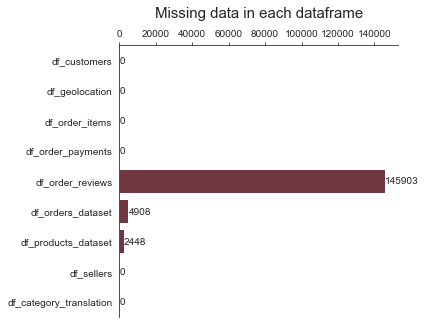

In [41]:
plt.figure(figsize=(5, 5))
ax = sns.barplot(x=missing,
                 y=dataset, color='#7B2E3E')

container = ax.containers[0]
ax.bar_label(container,
             labels=[f'{x:.0f}' for x in container.datavalues])
# ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.xaxis.tick_top()
plt.title('Missing data in each dataframe', fontsize=15, y=1.08)
plt.savefig('missing.png', transparent=True, bbox_inches='tight')
ax
plt.show()

In [42]:
dfs['df_orders_dataset'].isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [43]:
dfs['df_products_dataset'].isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [44]:
# a missing value in reviews means no comment was made
# some delivery dates are missing, probably from cancelled orders
# some product categories and description are missing

## <a name="C1.2">1.2 Products and their translation</a>

In [45]:
dfs['df_category_translation'].nunique()

product_category_name            71
product_category_name_english    71
dtype: int64

In [46]:
dfs['df_products_dataset'].nunique()

product_id                    32951
product_category_name            73
product_name_lenght              66
product_description_lenght     2960
product_photos_qty               19
product_weight_g               2204
product_length_cm                99
product_height_cm               102
product_width_cm                 95
dtype: int64

In [47]:
dfs['df_products_dataset'].duplicated('product_id').sum()

0

In [48]:
# Some categories are missing from the translation

In [49]:
diff = list(set(dfs['df_products_dataset'].product_category_name.unique())
            - set(dfs['df_category_translation'].product_category_name
                  .unique()))
diff

[nan, 'portateis_cozinha_e_preparadores_de_alimentos', 'pc_gamer']

In [50]:
# Adding translation of missing categories

In [51]:
trad_dict = {'product_category_name':
             ['portateis_cozinha_e_preparadores_de_alimentos',
              'pc_gamer',
              'nan'],
             'product_category_name_english':
             ['kitchen_utensils',
              'pc_gamer',
              'unknown']
             }

trad = pd.DataFrame.from_dict(trad_dict)

dfs['df_category_translation'] = dfs['df_category_translation']\
                                    .append(trad, ignore_index=True)

In [52]:
dfs['df_products_dataset'].head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [53]:
# Merge products and their translation
df_products = pd.merge(dfs['df_products_dataset'],
                       dfs['df_category_translation'],
                       on=['product_category_name'],
                       how='inner')

In [54]:
# Drop portuguese version
df_products.drop('product_category_name', axis=1, inplace=True)

In [55]:
# Creating groups of product categories
cat_dict = {
            'hygiene': ['health_beauty', 'perfumery', 'baby',
                        'diapers_and_hygiene'],
            'electronics': ['computers_accessories', 'telephony',
                            'fixed_telephony', 'small_appliances', 'audio',
                            'air_conditioning', 'electronics',
                            'home_appliances', 'computers',
                            'home_appliances_2',
                            'small_appliances_home_oven_and_coffee',
                            'cds_dvds_musicals', 'dvds_blu_ray',
                            'pc_gamer'],
            'furniture': ['bed_bath_table', 'furniture_decor',
                          'kitchen_dining_laundry_garden_furniture',
                          'housewares', 'home_confort',
                          'furniture_mattress_and_upholstery',
                          'furniture_living_room', 'furniture_bedroom',
                          'la_cuisine', 'home_comfort_2', 'kitchen_utensils'],
            'leisure': ['sports_leisure', 'toys', 'garden_tools',
                        'consoles_games', 'cool_stuff', 'luggage_accessories',
                        'party_supplies', 'musical_instruments', 'art',
                        'books_general_interest', 'christmas_supplies',
                        'books_imported', 'cine_photo', 'music',
                        'arts_and_craftmanship'],
            'fashion': ['watches_gifts', 'fashion_bags_accessories',
                        'fashion_shoes', 'fashion_male_clothing',
                        'fashion_underwear_beach',
                        'fashion_sport', 'fashio_female_clothing',
                        'fashion_childrens_clothes'],
            'groceries': ['food_drink', 'market_place', 'food', 'drinks'],
            'office': ['stationery', 'tablets_printing_image',
                       'office_furniture', 'books_technical'],
            'diy': ['construction_tools_construction',
                    'costruction_tools_garden',
                    'costruction_tools_tools', 'home_construction',
                    'construction_tools_lights', 'construction_tools_safety',
                    'flowers', 'auto', 'signaling_and_security'],
            'misc': ['pet_shop', 'agro_industry_and_commerce',
                     'industry_commerce_and_business',
                     'security_and_services', 'unknown']
            }

cat_group = []
cat_detail = []
for key, value in cat_dict.items():
    for j in value:
        cat_group.append(key)
        cat_detail.append(j)
cat_dict_detail = dict(zip(cat_detail, cat_group))

In [56]:
# Replace categories by groups of categories
df_products['product_category_name_english']\
    .replace(cat_dict_detail, inplace=True)

In [57]:
df_products.product_category_name_english.value_counts()

furniture      8462
leisure        7242
electronics    4392
hygiene        4243
diy            2928
fashion        2550
office         1290
misc            863
groceries       371
Name: product_category_name_english, dtype: int64

In [58]:
df_products.isna().sum()

product_id                       0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 1
product_length_cm                1
product_height_cm                1
product_width_cm                 1
product_category_name_english    0
dtype: int64

In [59]:
# Replacing missing dimensions and weight by category average
for i in ['product_weight_g', 'product_length_cm',
          'product_height_cm', 'product_width_cm']:
    df_products[i] = df_products.groupby(['product_category_name_english'],
                                         sort=False)[i]\
                                .apply(lambda x: x.fillna(x.median()))

In [60]:
df_products.loc[:, 'product_volume'] = df_products['product_length_cm'] *\
    df_products['product_height_cm'] * df_products['product_width_cm']

In [61]:
df_products = df_products.drop(['product_name_lenght',
                                'product_description_lenght',
                                'product_photos_qty',
                                'product_length_cm',
                                'product_height_cm',
                                'product_width_cm'], axis=1)

In [62]:
df_products.head()

,product_id,product_weight_g,product_category_name_english,product_volume
0,1e9e8ef04dbcff4541ed26657ea517e5,225.0,hygiene,2240.0
1,6a2fb4dd53d2cdb88e0432f1284a004c,400.0,hygiene,2700.0
2,0d009643171aee696f4733340bc2fdd0,422.0,hygiene,6048.0
3,b1eae565a61935e0011ee7682fef9dc9,267.0,hygiene,3757.0
4,8da90b37f0fb171b4877c124f965b1f6,377.0,hygiene,3510.0


## <a name="C1.3">1.3 Sellers and their location</a>

In [63]:
dfs['df_sellers'].head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [64]:
dfs['df_sellers'].describe(include="all")

,seller_id,seller_zip_code_prefix,seller_city,seller_state
count,3095,3095.000000,3095,3095
unique,3095,NaN,611,23
top,3442f8959a84dea7ee197c632cb2df15,NaN,sao paulo,SP
freq,1,NaN,694,1849
mean,NaN,32291.059451,NaN,NaN
std,NaN,32713.453830,NaN,NaN
min,NaN,1001.000000,NaN,NaN
25%,NaN,7093.500000,NaN,NaN
50%,NaN,14940.000000,NaN,NaN
75%,NaN,64552.500000,NaN,NaN


In [65]:
dfs['df_geolocation'].head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [66]:
dfs['df_geolocation'].isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [67]:
dfs['df_geolocation'].duplicated('geolocation_zip_code_prefix').sum()

981148

In [68]:
dfs['df_geolocation'] = dfs['df_geolocation']\
    .drop_duplicates(subset=['geolocation_zip_code_prefix'])

In [69]:
dfs['df_geolocation'].shape

(19015, 5)

In [70]:
# Removal of geographical outliers based on brazil coordinates

In [71]:
dfs['df_geolocation'] = dfs['df_geolocation'][dfs['df_geolocation']
                                              .geolocation_lat <= 5]
dfs['df_geolocation'] = dfs['df_geolocation'][dfs['df_geolocation']
                                              .geolocation_lat >= -35]
dfs['df_geolocation'] = dfs['df_geolocation'][dfs['df_geolocation']
                                              .geolocation_lng >= -75]
dfs['df_geolocation'] = dfs['df_geolocation'][dfs['df_geolocation']
                                              .geolocation_lng <= -35]

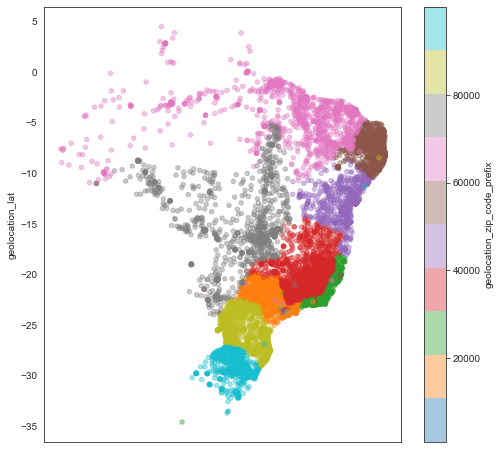

In [72]:
dfs['df_geolocation'].plot(kind='scatter',
                           x='geolocation_lng',
                           y='geolocation_lat',
                           c='geolocation_zip_code_prefix',
                           alpha=0.4,
                           cmap=plt.get_cmap('tab10'),
                           colorbar=True, figsize=(8, 8)
                           )
plt.show()

In [73]:
def brazil_map(feature):
    fig = px.scatter_mapbox(dfs['df_geolocation'],
                            lat='geolocation_lat',
                            lon='geolocation_lng',
                            color=feature,
                            size_max=5,
                            zoom=2,
                            mapbox_style='carto-positron',
                            opacity=0.3
                            )
    fig.update_layout(
        width=900,
        height=600,
        margin={"l": 0, "r": 0, "t": 0, "b": 0},
    )
    fig.show()

In [74]:
brazil_map(dfs['df_geolocation'].geolocation_zip_code_prefix)

In [75]:
# Adding location to sellers by merging

In [76]:
df_sellers = pd.merge(dfs['df_sellers'],
                      dfs['df_geolocation'],
                      how='left',
                      left_on='seller_zip_code_prefix',
                      right_on='geolocation_zip_code_prefix')\
               .drop(columns=['geolocation_state', 'geolocation_city',
                              'geolocation_zip_code_prefix',
                              'seller_zip_code_prefix'])\
               .rename(columns={'geolocation_lat': 'seller_lat',
                                'geolocation_lng': 'seller_long'})

In [77]:
df_sellers.head()

,seller_id,seller_city,seller_state,seller_lat,seller_long
0,3442f8959a84dea7ee197c632cb2df15,campinas,SP,-22.898536,-47.063125
1,d1b65fc7debc3361ea86b5f14c68d2e2,mogi guacu,SP,-22.382941,-46.946641
2,ce3ad9de960102d0677a81f5d0bb7b2d,rio de janeiro,RJ,-22.910641,-43.176510
3,c0f3eea2e14555b6faeea3dd58c1b1c3,sao paulo,SP,-23.657250,-46.610759
4,51a04a8a6bdcb23deccc82b0b80742cf,braganca paulista,SP,-22.971648,-46.533618


In [78]:
df_sellers.isna().sum()

seller_id        0
seller_city      0
seller_state     0
seller_lat      16
seller_long     16
dtype: int64

In [79]:
# Some coordinates are missing,
# we use the average of their state to attribuate one

In [80]:
for i in ['seller_lat', 'seller_long']:
    df_sellers[i] = df_sellers.groupby(['seller_state'],
                                       sort=False)[i]\
                              .apply(lambda x: x.fillna(x.median()))

In [81]:
df_sellers.isna().sum()

seller_id       0
seller_city     0
seller_state    0
seller_lat      0
seller_long     0
dtype: int64

## <a name="C1.4">1.4 Order items with products and sellers</a>

In [82]:
dfs['df_order_items'].head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [83]:
dfs['df_order_items'].duplicated('order_id').sum()

13984

In [84]:
# Check for order_id and order_item_id combination for duplicates

In [85]:
duplicates = dfs['df_order_items'][dfs['df_order_items']
                                   .duplicated(subset=['order_id',
                                                       'order_item_id'],
                                               keep=False)]
duplicates.count().sum()

0

In [86]:
df_products.head()

,product_id,product_weight_g,product_category_name_english,product_volume
0,1e9e8ef04dbcff4541ed26657ea517e5,225.0,hygiene,2240.0
1,6a2fb4dd53d2cdb88e0432f1284a004c,400.0,hygiene,2700.0
2,0d009643171aee696f4733340bc2fdd0,422.0,hygiene,6048.0
3,b1eae565a61935e0011ee7682fef9dc9,267.0,hygiene,3757.0
4,8da90b37f0fb171b4877c124f965b1f6,377.0,hygiene,3510.0


In [87]:
df_order_item = pd.merge(dfs['df_order_items'],
                         df_products, 'left',
                         on='product_id')

In [88]:
df_order_item.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_weight_g,product_category_name_english,product_volume
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,650.0,leisure,3528.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,30000.0,misc,60000.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,3050.0,furniture,14157.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,200.0,hygiene,2400.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,3750.0,leisure,42000.0


In [89]:
df_order_item.isna().sum()

order_id                            0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_weight_g                 1603
product_category_name_english    1603
product_volume                   1603
dtype: int64

In [90]:
# Some products don't have products information
# = {product_weight_g, product_category_name_english, product_volume}

In [91]:
# As there are multiple items per order,
# these items are aggregated for each order

In [92]:
# def mode(x): return x.mode if len(x) > 1 else x
def mode(x): return stats.mode(x)[0] if len(x) > 1 else x


agg_dict = {'order_item_id': np.max,
            'seller_id': np.max,
            'price': np.sum,
            'freight_value': np.sum,
            'product_weight_g': np.mean,
            'product_volume': np.mean,
            'product_category_name_english': mode
            }

In [93]:
df_order_item = df_order_item.groupby('order_id').agg(agg_dict).reset_index()

In [94]:
df_order_item.head()

,order_id,order_item_id,seller_id,price,freight_value,product_weight_g,product_volume,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,48436dade18ac8b2bce089ec2a041202,58.90,13.29,650.0,3528.0,leisure
1,00018f77f2f0320c557190d7a144bdd3,1,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,30000.0,60000.0,misc
2,000229ec398224ef6ca0657da4fc703e,1,5b51032eddd242adc84c38acab88f23d,199.00,17.87,3050.0,14157.0,furniture
3,00024acbcdf0a6daa1e931b038114c75,1,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,200.0,2400.0,hygiene
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,df560393f3a51e74553ab94004ba5c87,199.90,18.14,3750.0,42000.0,leisure


In [95]:
df_order_item.product_category_name_english.value_counts()

furniture      22753
leisure        22306
electronics    16181
hygiene        14815
fashion         8014
diy             5980
office          3874
misc            2117
groceries       1237
0                102
Name: product_category_name_english, dtype: int64

In [96]:
df_order_item.shape

(98666, 8)

In [97]:
df_order_item.isna().sum()

order_id                            0
order_item_id                       0
seller_id                           0
price                               0
freight_value                       0
product_weight_g                 1389
product_volume                   1389
product_category_name_english    1287
dtype: int64

In [98]:
# Merge with seller info after aggregation

In [99]:
df_order_item = pd.merge(df_order_item,
                         df_sellers, 'left',
                         on='seller_id')

In [100]:
df_order_item.isna().sum()

order_id                            0
order_item_id                       0
seller_id                           0
price                               0
freight_value                       0
product_weight_g                 1389
product_volume                   1389
product_category_name_english    1287
seller_city                         0
seller_state                        0
seller_lat                          0
seller_long                         0
dtype: int64

In [101]:
# Imputation of missing values by KNN imputation

In [102]:
df_order_item.loc[df_order_item['product_category_name_english'] == 0,
                  ['product_category_name_english']] = np.nan

In [103]:
df_order_item.product_category_name_english.value_counts()

furniture      22753
leisure        22306
electronics    16181
hygiene        14815
fashion         8014
diy             5980
office          3874
misc            2117
groceries       1237
Name: product_category_name_english, dtype: int64

In [104]:
df_order_item.isna().sum()

order_id                            0
order_item_id                       0
seller_id                           0
price                               0
freight_value                       0
product_weight_g                 1389
product_volume                   1389
product_category_name_english    1389
seller_city                         0
seller_state                        0
seller_lat                          0
seller_long                         0
dtype: int64

In [105]:
df_order_item.head()

,order_id,order_item_id,seller_id,price,freight_value,product_weight_g,product_volume,product_category_name_english,seller_city,seller_state,seller_lat,seller_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,48436dade18ac8b2bce089ec2a041202,58.90,13.29,650.0,3528.0,leisure,volta redonda,SP,-22.498183,-44.123614
1,00018f77f2f0320c557190d7a144bdd3,1,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,30000.0,60000.0,misc,sao paulo,SP,-23.566258,-46.518417
2,000229ec398224ef6ca0657da4fc703e,1,5b51032eddd242adc84c38acab88f23d,199.00,17.87,3050.0,14157.0,furniture,borda da mata,MG,-22.264094,-46.158564
3,00024acbcdf0a6daa1e931b038114c75,1,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,200.0,2400.0,hygiene,franca,SP,-20.548228,-47.395897
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,df560393f3a51e74553ab94004ba5c87,199.90,18.14,3750.0,42000.0,leisure,loanda,PR,-22.931427,-53.133759


In [106]:
X_imputer = df_order_item[['price', 'freight_value', 'product_weight_g',
                           'product_volume',
                           'product_category_name_english']]

In [107]:
category_df = pd.get_dummies(X_imputer.product_category_name_english)
X_imputer = pd.concat([X_imputer, category_df], axis=1)
X_imputer.drop('product_category_name_english', axis=1, inplace=True)

In [108]:
X_imputer.head()

,price,freight_value,product_weight_g,product_volume,diy,electronics,fashion,furniture,groceries,hygiene,leisure,misc,office
0,58.90,13.29,650.0,3528.0,0,0,0,0,0,0,1,0,0
1,239.90,19.93,30000.0,60000.0,0,0,0,0,0,0,0,1,0
2,199.00,17.87,3050.0,14157.0,0,0,0,1,0,0,0,0,0
3,12.99,12.79,200.0,2400.0,0,0,0,0,0,1,0,0,0
4,199.90,18.14,3750.0,42000.0,0,0,0,0,0,0,1,0,0


In [109]:
imputer = KNNImputer(n_neighbors=3)
X_imputed = pd.DataFrame(imputer.fit_transform(X_imputer),
                         columns=X_imputer.columns)

In [110]:
X_imputed['category'] = X_imputed[['diy', 'electronics',
                                   'fashion', 'furniture', 'groceries',
                                   'hygiene', 'leisure', 'misc',
                                   'office']].idxmax(axis=1)

In [111]:
X_imputed.head()

,price,freight_value,product_weight_g,product_volume,diy,electronics,fashion,furniture,groceries,hygiene,leisure,misc,office,category
0,58.90,13.29,650.0,3528.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,leisure
1,239.90,19.93,30000.0,60000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,misc
2,199.00,17.87,3050.0,14157.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,furniture
3,12.99,12.79,200.0,2400.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,hygiene
4,199.90,18.14,3750.0,42000.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,leisure


In [112]:
df_order_item.head()

,order_id,order_item_id,seller_id,price,freight_value,product_weight_g,product_volume,product_category_name_english,seller_city,seller_state,seller_lat,seller_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,48436dade18ac8b2bce089ec2a041202,58.90,13.29,650.0,3528.0,leisure,volta redonda,SP,-22.498183,-44.123614
1,00018f77f2f0320c557190d7a144bdd3,1,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,30000.0,60000.0,misc,sao paulo,SP,-23.566258,-46.518417
2,000229ec398224ef6ca0657da4fc703e,1,5b51032eddd242adc84c38acab88f23d,199.00,17.87,3050.0,14157.0,furniture,borda da mata,MG,-22.264094,-46.158564
3,00024acbcdf0a6daa1e931b038114c75,1,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,200.0,2400.0,hygiene,franca,SP,-20.548228,-47.395897
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,df560393f3a51e74553ab94004ba5c87,199.90,18.14,3750.0,42000.0,leisure,loanda,PR,-22.931427,-53.133759


In [113]:
df_order_item[['product_weight_g', 'product_volume',
               'product_category_name_english']] =\
                    X_imputed[['product_weight_g',
                               'product_volume',
                               'category']].to_numpy()

In [114]:
df_order_item.head()

,order_id,order_item_id,seller_id,price,freight_value,product_weight_g,product_volume,product_category_name_english,seller_city,seller_state,seller_lat,seller_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,48436dade18ac8b2bce089ec2a041202,58.90,13.29,650.0,3528.0,leisure,volta redonda,SP,-22.498183,-44.123614
1,00018f77f2f0320c557190d7a144bdd3,1,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,30000.0,60000.0,misc,sao paulo,SP,-23.566258,-46.518417
2,000229ec398224ef6ca0657da4fc703e,1,5b51032eddd242adc84c38acab88f23d,199.00,17.87,3050.0,14157.0,furniture,borda da mata,MG,-22.264094,-46.158564
3,00024acbcdf0a6daa1e931b038114c75,1,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,200.0,2400.0,hygiene,franca,SP,-20.548228,-47.395897
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,df560393f3a51e74553ab94004ba5c87,199.90,18.14,3750.0,42000.0,leisure,loanda,PR,-22.931427,-53.133759


In [115]:
df_order_item.isna().sum()

order_id                         0
order_item_id                    0
seller_id                        0
price                            0
freight_value                    0
product_weight_g                 0
product_volume                   0
product_category_name_english    0
seller_city                      0
seller_state                     0
seller_lat                       0
seller_long                      0
dtype: int64

In [116]:
# Drop seller id
df_order_item.drop('seller_id', axis=1, inplace=True)

## <a name="C1.5">1.5 Regrouping all orders data</a>

In [117]:
dfs['df_order_reviews'].head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [118]:
dfs['df_order_reviews'].drop(['review_comment_title',
                              'review_comment_message',
                              'review_creation_date',
                              'review_answer_timestamp',
                              'review_id'],
                             axis=1, inplace=True)

In [119]:
df_order_review = dfs['df_order_reviews']
df_order_review.head()

,order_id,review_score
0,73fc7af87114b39712e6da79b0a377eb,4
1,a548910a1c6147796b98fdf73dbeba33,5
2,f9e4b658b201a9f2ecdecbb34bed034b,5
3,658677c97b385a9be170737859d3511b,5
4,8e6bfb81e283fa7e4f11123a3fb894f1,5


In [120]:
df_order_review.isna().sum()

order_id        0
review_score    0
dtype: int64

In [121]:
dfs['df_order_payments'].head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [122]:
dfs['df_order_payments'].payment_type.value_counts()

credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

In [123]:
payment_type_dict = {
                     'credit_card': 1,
                     'boleto': 0,
                     'voucher': 0,
                     'debit_card': 0,
                     'not_defined': 0,
                     }

dfs['df_order_payments']['payment_type']\
    .replace(payment_type_dict, inplace=True)

In [124]:
dfs['df_order_payments'].rename(columns={'payment_type': 'perc_credit'},
                                inplace=True)

In [125]:
dfs['df_order_payments'].isna().sum()

order_id                0
payment_sequential      0
perc_credit             0
payment_installments    0
payment_value           0
dtype: int64

In [126]:
dfs['df_order_payments'].duplicated('order_id').sum()

4446

In [127]:
# Rows with same order id will be grouped

In [128]:
def mode(x): return stats.mode(x)[0] if len(x) > 1 else x


agg_dict2 = {
             'perc_credit': np.mean,
             'payment_installments': np.mean,
             'payment_value': np.sum
             }

In [129]:
df_order_payments = dfs['df_order_payments']\
                    .groupby('order_id').agg(agg_dict2).reset_index()

In [130]:
dfs['df_orders_dataset'].head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [131]:
dfs['df_orders_dataset'].order_status.value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [132]:
# Only orders that are already delivered are considered

In [133]:
df_order_dataset = dfs['df_orders_dataset']\
    .loc[dfs['df_orders_dataset']['order_status'] == 'delivered']

In [134]:
df_order_dataset.order_status.value_counts()

delivered    96478
Name: order_status, dtype: int64

In [135]:
df_order_dataset.drop(['order_status',
                       'order_approved_at',
                       'order_delivered_carrier_date',
                       'order_estimated_delivery_date'],
                      axis=1, inplace=True)

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [136]:
df_order_dataset.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02


In [137]:
df_order_dataset.isna().sum()

order_id                         0
customer_id                      0
order_purchase_timestamp         0
order_delivered_customer_date    8
dtype: int64

In [138]:
df_order_dataset =\
    df_order_dataset[df_order_dataset['order_delivered_customer_date'].notna()]

In [139]:
df_order_dataset.duplicated('order_id').sum()

0

In [140]:
df_order_dataset.isna().sum()

order_id                         0
customer_id                      0
order_purchase_timestamp         0
order_delivered_customer_date    0
dtype: int64

In [141]:
df_orders = pd.merge(df_order_dataset,
                     df_order_item,
                     on=['order_id'],
                     how='left')

In [142]:
df_orders = pd.merge(df_orders,
                     df_order_review,
                     on=['order_id'],
                     how='left')

In [143]:
df_orders = pd.merge(df_orders,
                     df_order_payments,
                     on=['order_id'],
                     how='left')

In [144]:
df_orders.isna().sum()

order_id                           0
customer_id                        0
order_purchase_timestamp           0
order_delivered_customer_date      0
order_item_id                      0
price                              0
freight_value                      0
product_weight_g                   0
product_volume                     0
product_category_name_english      0
seller_city                        0
seller_state                       0
seller_lat                         0
seller_long                        0
review_score                     646
perc_credit                        1
payment_installments               1
payment_value                      1
dtype: int64

In [145]:
# Missing payment type is dropped,
# and missing review scores are replaced by the middle grade

In [146]:
df_orders.dropna(subset=['perc_credit'], how='all', inplace=True)

In [147]:
df_orders = df_orders.fillna(3)

In [148]:
df_orders.isna().sum()

order_id                         0
customer_id                      0
order_purchase_timestamp         0
order_delivered_customer_date    0
order_item_id                    0
price                            0
freight_value                    0
product_weight_g                 0
product_volume                   0
product_category_name_english    0
seller_city                      0
seller_state                     0
seller_lat                       0
seller_long                      0
review_score                     0
perc_credit                      0
payment_installments             0
payment_value                    0
dtype: int64

In [149]:
df_orders1 = df_orders

In [150]:
# reset
df_orders = df_orders1

## <a name="C1.6">1.6 Regrouping all customer data</a>

In [151]:
dfs['df_customers'].isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [152]:
df_customer = pd.merge(dfs['df_customers'],
                       df_orders,
                       on=['customer_id'],
                       how='left')

In [153]:
df_customer.isna().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                         2972
order_purchase_timestamp         2972
order_delivered_customer_date    2972
order_item_id                    2972
price                            2972
freight_value                    2972
product_weight_g                 2972
product_volume                   2972
product_category_name_english    2972
seller_city                      2972
seller_state                     2972
seller_lat                       2972
seller_long                      2972
review_score                     2972
perc_credit                      2972
payment_installments             2972
payment_value                    2972
dtype: int64

In [154]:
# Remove rows without order
df_customer.dropna(subset=['order_id'], how='all', inplace=True)

In [155]:
df_customer.isna().sum()

customer_id                      0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_id                         0
order_purchase_timestamp         0
order_delivered_customer_date    0
order_item_id                    0
price                            0
freight_value                    0
product_weight_g                 0
product_volume                   0
product_category_name_english    0
seller_city                      0
seller_state                     0
seller_lat                       0
seller_long                      0
review_score                     0
perc_credit                      0
payment_installments             0
payment_value                    0
dtype: int64

In [156]:
df_customer = pd.merge(df_customer,
                       dfs['df_geolocation'],
                       how='left',
                       left_on='customer_zip_code_prefix',
                       right_on='geolocation_zip_code_prefix')\
                .drop(columns=['geolocation_zip_code_prefix',
                               'customer_zip_code_prefix',
                               'geolocation_city',
                               'geolocation_state'])\
                .rename(columns={'geolocation_lat': 'customer_lat',
                                 'geolocation_lng': 'customer_long'})

In [157]:
df_customer.head()

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_purchase_timestamp,order_delivered_customer_date,order_item_id,price,freight_value,product_weight_g,product_volume,product_category_name_english,seller_city,seller_state,seller_lat,seller_long,review_score,perc_credit,payment_installments,payment_value,customer_lat,customer_long
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017-05-25 10:35:35,1.0,124.99,21.88,8683.0,107136.0,office,itaquaquecetuba,SP,-23.482623,-46.374490,4.0,1.0,2.0,146.87,-20.509897,-47.397866
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018-01-29 12:41:19,1.0,289.00,46.48,10150.0,53400.0,furniture,itajai,SC,-26.912429,-48.677381,5.0,1.0,8.0,335.48,-23.726853,-46.545746
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018-06-14 17:58:51,1.0,139.94,17.79,8267.0,45968.0,office,itaquaquecetuba,SP,-23.482623,-46.374490,5.0,1.0,7.0,157.73,-23.527788,-46.660310
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,2018-03-28 16:04:25,1.0,149.94,23.36,12160.0,79968.0,office,itaquaquecetuba,SP,-23.482623,-46.374490,5.0,1.0,1.0,173.30,-23.496930,-46.185352
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,2018-08-09 20:55:48,1.0,230.00,22.25,5200.0,23625.0,furniture,ibitinga,SP,-21.766477,-48.831547,5.0,1.0,8.0,252.25,-22.987222,-47.151073


In [158]:
df_customer.isna().sum()

customer_id                         0
customer_unique_id                  0
customer_city                       0
customer_state                      0
order_id                            0
order_purchase_timestamp            0
order_delivered_customer_date       0
order_item_id                       0
price                               0
freight_value                       0
product_weight_g                    0
product_volume                      0
product_category_name_english       0
seller_city                         0
seller_state                        0
seller_lat                          0
seller_long                         0
review_score                        0
perc_credit                         0
payment_installments                0
payment_value                       0
customer_lat                     1448
customer_long                    1448
dtype: int64

In [159]:
# Filling missing customer latitude and longitude by using states
for i in ['customer_lat', 'customer_long']:
    df_customer[i] = df_customer.groupby(['customer_state'],
                                         sort=False)[i]\
                                .apply(lambda x: x.fillna(x.median()))

In [160]:
# Renaming few columns for clarity
df_customer.rename(columns={'order_item_id': 'nb_of_items',
                            'product_category_name_english': 'category',
                            'order_purchase_timestamp': 'date_purchase',
                            'order_delivered_customer_date': 'date_delivery'},
                   inplace=True)

In [161]:
df_customer.isna().sum()

customer_id             0
customer_unique_id      0
customer_city           0
customer_state          0
order_id                0
date_purchase           0
date_delivery           0
nb_of_items             0
price                   0
freight_value           0
product_weight_g        0
product_volume          0
category                0
seller_city             0
seller_state            0
seller_lat              0
seller_long             0
review_score            0
perc_credit             0
payment_installments    0
payment_value           0
customer_lat            0
customer_long           0
dtype: int64

# <a name="C2">2. Cleaning</a>

In [162]:
df = df_customer

## <a name="C2.1">2.1 ID and duplicates</a>

### 2.1.1 Checking for duplicates

In [163]:
df.duplicated('customer_id').sum()

529

In [164]:
df.duplicated('order_id').sum()

529

In [165]:
# Getting rid of duplicates
df = df\
    .drop_duplicates(subset=['customer_id'])

### 2.1.2 Customer id

In [166]:
# Drop customer id, as it is unique to order id and the name is misleading
df.drop('customer_id', axis=1, inplace=True)

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## <a name="C2.2">2.2 Location</a>

### 2.2.1 Cities

In [167]:
df.customer_city.value_counts()

sao paulo                           15045
rio de janeiro                       6601
belo horizonte                       2697
brasilia                             2071
curitiba                             1489
campinas                             1406
porto alegre                         1341
salvador                             1188
guarulhos                            1143
sao bernardo do campo                 911
niteroi                               825
santo andre                           778
osasco                                724
santos                                700
sao jose dos campos                   667
goiania                               660
fortaleza                             618
sorocaba                              609
recife                                593
florianopolis                         556
jundiai                               549
ribeirao preto                        499
belem                                 431
juiz de fora                      

In [168]:
# largest cities don't include a significant enoguh part of the populations,
# there's no point in keeping cities
df.drop(['customer_city', 'seller_city'], axis=1, inplace=True)

### 2.2.2 GPS coordinates

In [169]:
def brazil_map2(feature):
    fig = px.scatter_mapbox(df,
                            lat='customer_lat',
                            lon='customer_long',
                            color=feature,
                            size_max=5,
                            zoom=2,
                            mapbox_style='carto-positron',
                            opacity=0.3
                            )
    fig.update_layout(
        width=900,
        height=600,
        margin={"l": 0, "r": 0, "t": 0, "b": 0},
    )
    fig.show()

In [170]:
brazil_map2(df.customer_state)

### 2.2.3 States

In [171]:
df.customer_state.unique()

array(['SP', 'SC', 'MG', 'PR', 'RJ', 'RS', 'PA', 'GO', 'ES', 'BA', 'MA',
       'MS', 'CE', 'DF', 'RN', 'PE', 'MT', 'AM', 'AP', 'AL', 'RO', 'PB',
       'TO', 'PI', 'AC', 'SE', 'RR'], dtype=object)

In [172]:
# Brazil states and its federal district 'DF' can be grouped in regions
# researchgate.net/figure/Map-of-Brazil-showing-the-states-belonging-to-each-region-Acronyms-for-each-state_fig1_341914696

In [173]:
# Regrouping states into regions
state_dict = {
              'North': ['AC', 'AP', 'AM', 'PA', 'RO', 'RR', 'TO'],
              'Northeast': ['AL', 'BA', 'CE', 'MA', 'PB', 'PE', 'PI',
                            'RN', 'SE'],
              'Southeast': ['ES', 'MG', 'RJ', 'SP'],
              'South': ['PR', 'RS', 'SC'],
              'Centerwest': ['DF', 'GO', 'MT', 'MS']
              }

state_group = []
state_detail = []
for key, value in state_dict.items():
    for j in value:
        state_group.append(key)
        state_detail.append(j)
state_dict_detail = dict(zip(state_detail, state_group))

In [174]:
# Replace states by regions
df['customer_state']\
    .replace(state_dict_detail, inplace=True)
df['seller_state']\
    .replace(state_dict_detail, inplace=True)

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py:6619: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [175]:
df.customer_state.value_counts()

Southeast     66192
South         13813
Northeast      9044
Centerwest     5624
North          1796
Name: customer_state, dtype: int64

In [176]:
df.seller_state.value_counts()

Southeast     80545
South         12935
Northeast      1525
Centerwest     1440
North            24
Name: seller_state, dtype: int64

In [177]:
# Note that 2 regions have more than 95% of all sellers

## <a name="C2.3">2.3 Payment</a>

### 2.3.1 Payment installments

In [178]:
df.payment_installments.value_counts()

1.000000     46811
2.000000     11930
3.000000     10036
4.000000      6784
10.000000     5036
5.000000      5008
8.000000      4080
6.000000      3728
7.000000      1543
9.000000       610
1.500000       215
12.000000      124
5.500000        94
2.500000        92
15.000000       70
3.500000        59
4.500000        44
18.000000       26
11.000000       22
1.333333        18
1.666667        17
24.000000       16
20.000000       16
13.000000       15
14.000000       11
6.500000         8
17.000000        7
7.500000         6
16.000000        5
1.166667         3
1.285714         3
21.000000        3
2.666667         3
1.750000         3
2.250000         2
12.500000        2
2.333333         2
1.250000         2
0.000000         2
1.400000         2
1.545455         1
1.142857         1
2.600000         1
1.833333         1
4.333333         1
1.111111         1
9.500000         1
1.200000         1
23.000000        1
22.000000        1
3.666667         1
Name: payment_installments, dty

### 2.3.2 Payment type

df.payment_type.value_counts()

### 2.3.3 Payment value

<AxesSubplot:xlabel='payment_value', ylabel='payment_value'>

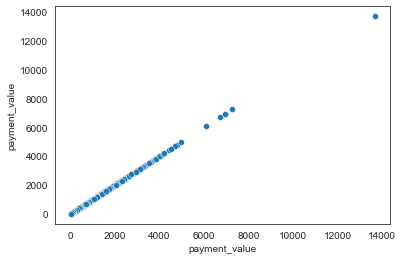

In [179]:
sns.scatterplot(x=df.payment_value, y=df.payment_value)

In [180]:
df.payment_value.describe()

count    96469.000000
mean       159.855320
std        218.820934
min          9.590000
25%         61.880000
50%        105.280000
75%        176.330000
max      13664.080000
Name: payment_value, dtype: float64

### 2.3.4 Price

In [181]:
# Price can be removed as payment value already gives the total

In [182]:
df.drop('price', axis=1, inplace=True)

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 2.3.5 Freight value

In [183]:
# Freight value can serve as an indicator of distance between seller and buyer

<AxesSubplot:xlabel='freight_value', ylabel='freight_value'>

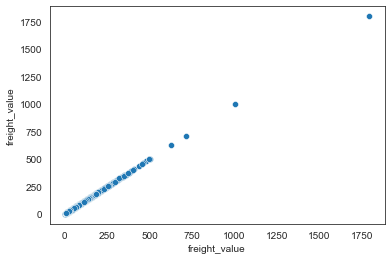

In [184]:
sns.scatterplot(x=df.freight_value, y=df.freight_value)

In [185]:
# Its distribution follows the total payment

In [186]:
df.freight_value.describe()

count    96469.000000
mean        22.785946
std         21.560022
min          0.000000
25%         13.850000
50%         17.170000
75%         24.020000
max       1794.960000
Name: freight_value, dtype: float64

## <a name="C2.4">2.4 Products information</a>

### 2.4.1 Category

In [187]:
df.category.value_counts()

furniture      22299
leisure        21782
electronics    15812
hygiene        14472
fashion         7819
diy             7189
office          3804
misc            2086
groceries       1206
Name: category, dtype: int64

### 2.4.2 Product weight

<AxesSubplot:xlabel='product_weight_g', ylabel='product_weight_g'>

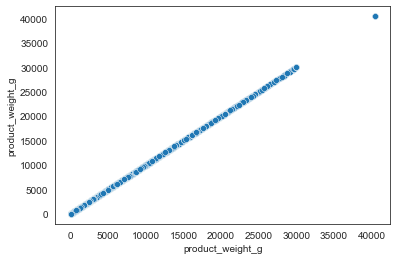

In [188]:
sns.scatterplot(x=df.product_weight_g, y=df.product_weight_g)

In [189]:
df.product_weight_g.describe()

count    96469.000000
mean      2095.998677
std       3732.775057
min          0.000000
25%        300.000000
50%        700.000000
75%       1813.000000
max      40425.000000
Name: product_weight_g, dtype: float64

### 2.4.3 Number of items

In [190]:
df.nb_of_items.value_counts()

1.0     86835
2.0      7392
3.0      1305
4.0       495
5.0       193
6.0       191
7.0        22
8.0         8
10.0        8
12.0        5
11.0        4
9.0         3
15.0        2
20.0        2
14.0        2
13.0        1
21.0        1
Name: nb_of_items, dtype: int64

## <a name='C2.5'>2.5 Review score</a>

In [191]:
df.review_score.value_counts()

5.0    56757
4.0    18893
1.0     9342
3.0     8554
2.0     2923
Name: review_score, dtype: int64

df.review_score = df.review_score.astype('int')

df.review_score = df.review_score.astype('category')

df.review_score.value_counts()


## <a name='C2.6'>2.6 Dates</a>

In [192]:
df.date_purchase = pd.to_datetime(df.date_purchase)
df.date_delivery = pd.to_datetime(df.date_delivery)

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [193]:
df[['date_purchase', 'date_delivery']].describe(datetime_is_numeric=True)

,date_purchase,date_delivery
count,96469,96469
mean,2018-01-01 23:24:47.665975552,2018-01-14 12:47:59.778654208
min,2016-10-03 09:44:50,2016-10-11 13:46:32
25%,2017-09-14 08:57:12,2017-09-25 22:18:08
50%,2018-01-20 19:37:42,2018-02-02 19:36:08
75%,2018-05-05 18:30:17,2018-05-15 22:56:45
max,2018-08-29 15:00:37,2018-10-17 13:22:46


In [194]:
# No visible outlier

In [195]:
# Delivery time can be inferred from the difference
# between purchase and delivery

In [196]:
df.loc[:, 'delivery_time'] = abs(df['date_purchase']-df['date_delivery'])

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='delivery_time', ylabel='delivery_time'>

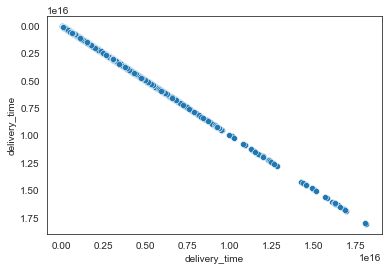

In [197]:
sns.scatterplot(x=df.delivery_time, y=df.delivery_time)

In [198]:
df.delivery_time.describe()

count                         96469
mean     12 days 13:23:12.112678684
std       9 days 13:05:08.423019194
min                 0 days 12:48:07
25%                 6 days 18:23:15
50%                10 days 05:13:08
75%                15 days 17:16:54
max               209 days 15:05:12
Name: delivery_time, dtype: object

In [199]:
df.delivery_time = (pd.to_timedelta(df.delivery_time, unit='d'))\
                    .astype('timedelta64[D]')

/Users/victorbenard/opt/anaconda3/lib/python3.9/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [200]:
df.delivery_time.describe()

count    96469.000000
mean        12.093170
std          9.550476
min          0.000000
25%          6.000000
50%         10.000000
75%         15.000000
max        209.000000
Name: delivery_time, dtype: float64

bins = [-1, 2, 6, 14, 30, np.inf]
names = ['48h', '3 to 6 days', '1 to 2 weeks',
         '3 weeks to 1 month', 'more than 1 month']

df.delivery_time = pd.cut(df.delivery_time, bins, labels=names)

df.delivery_time.value_counts()

In [201]:
df.dtypes

customer_unique_id              object
customer_state                  object
order_id                        object
date_purchase           datetime64[ns]
date_delivery           datetime64[ns]
nb_of_items                    float64
freight_value                  float64
product_weight_g               float64
product_volume                 float64
category                        object
seller_state                    object
seller_lat                     float64
seller_long                    float64
review_score                   float64
perc_credit                    float64
payment_installments           float64
payment_value                  float64
customer_lat                   float64
customer_long                  float64
delivery_time                  float64
dtype: object

# <a name="C3">3. Exportation</a>

In [202]:
df.to_csv('cleaned.csv', index=False)